# Asad Ullah - 205924 - MSCS07

## Assignment 1 - 2.1

In [1]:
#importing helper functions from helper_function.py
%run "helper_functions.py"
%matplotlib inline

In [2]:
#creating a list for images
imgs=allImages()

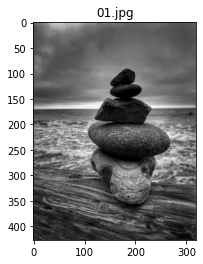

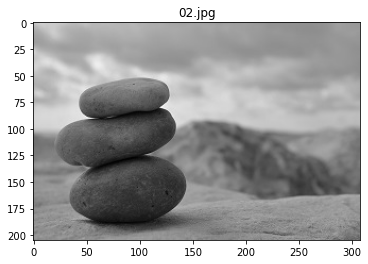

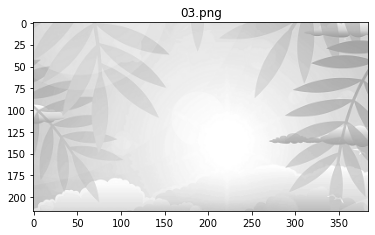

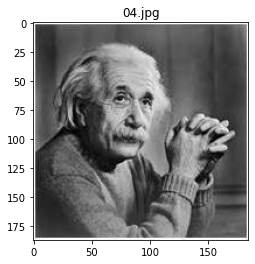

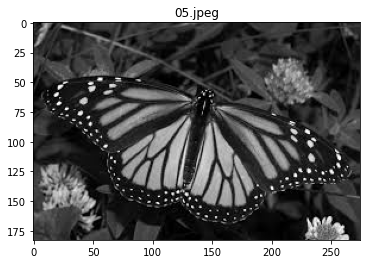

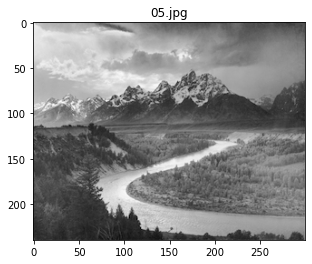

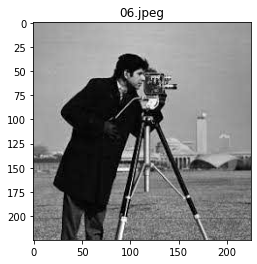

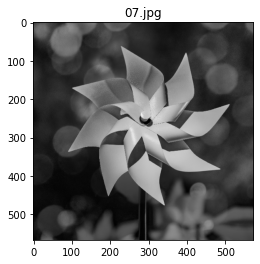

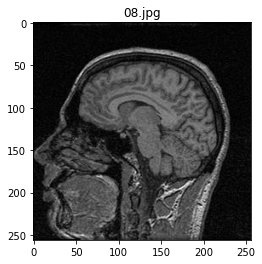

In [3]:
#creating grayscale images
for img_nm in imgs:
    img = cv2.imread("images\\" + img_nm,0)
    displayImage(img, img_nm)


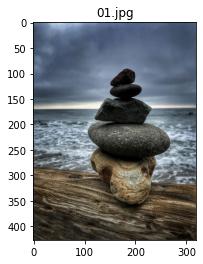

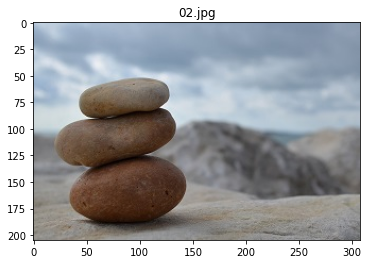

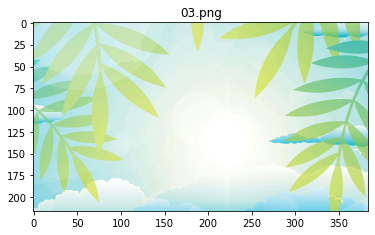

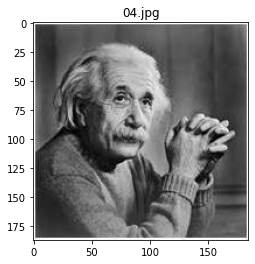

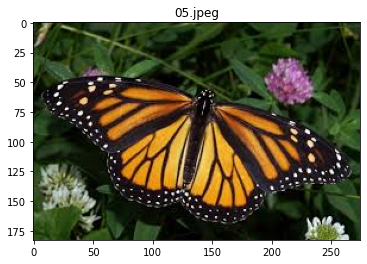

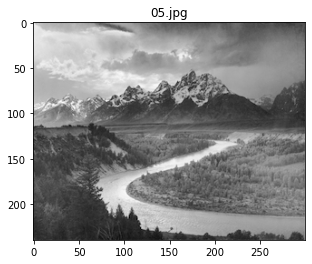

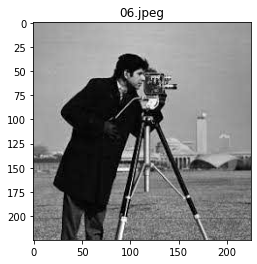

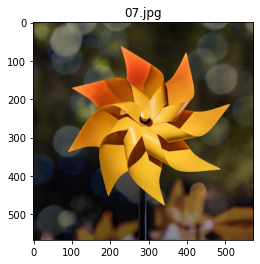

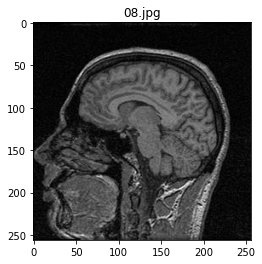

In [4]:
#creating RGB images - BGR (default in open-cv) is converted to RGB (default in matplotlib) in helper function to be used in matplotlib plt function
for img_nm in imgs:
    img = cv2.imread("images\\" + img_nm,1)
    displayImage(img, img_nm)

## Assignment 1 - 2.2

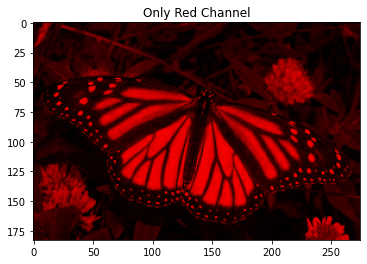

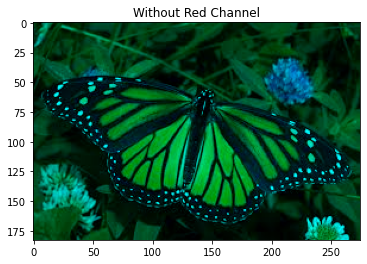

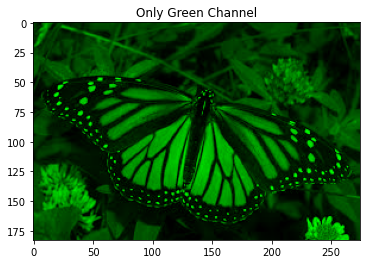

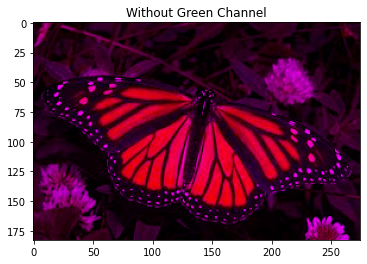

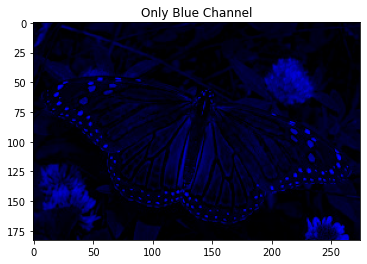

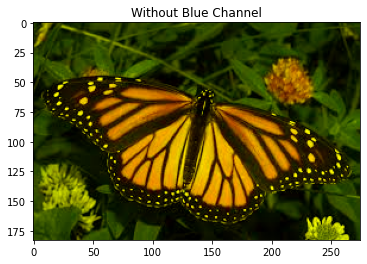

In [5]:
#Loading the image of Butterfly from the allImages function
img = cv2.imread("images\\"+imgs[4],1)
#Loads the Color Channel image and subtracts it from a copy of Original image to Loads the image without that channel
rgbExclusion(img,"R")
rgbExclusion(img,"G")
rgbExclusion(img,"B")

## Assignment 1 - 2.3

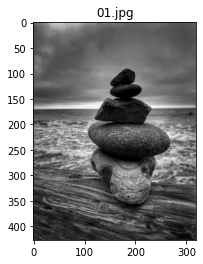

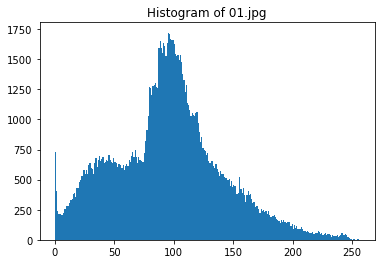

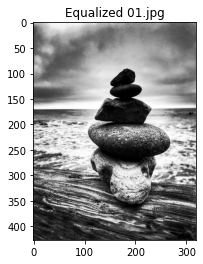

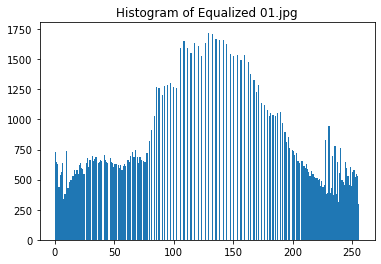

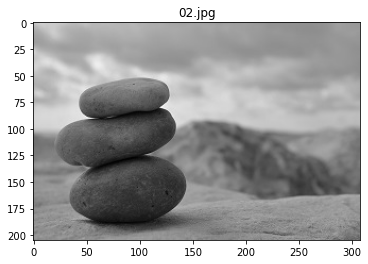

...

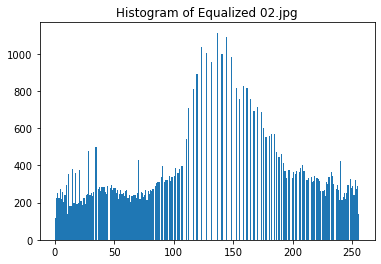

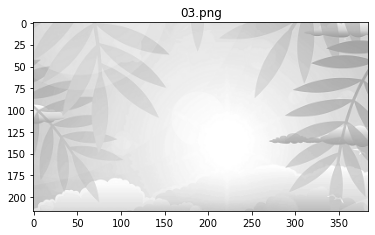

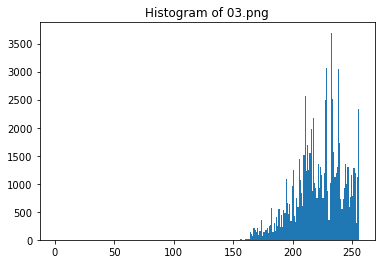

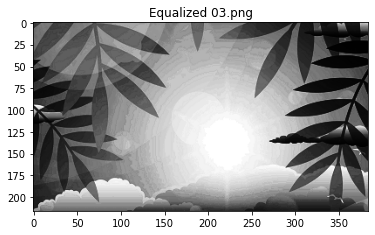

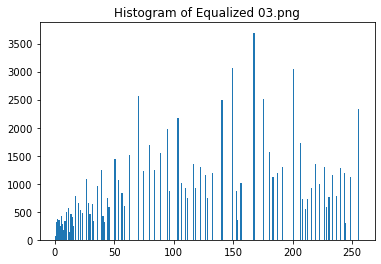

In [6]:
i=0
for img_nm in imgs:
    i=i+1
    img = cv2.imread("images\\" + img_nm,0)
    displayImage(img,img_nm)
    displayHistogram(img,img_nm)
    #Function available in open cv for histogram equalization
    img_equ=cv2.equalizeHist(img)
    displayImage(img_equ,"Equalized " + img_nm)
    displayHistogram(img_equ,"Equalized " + img_nm)
    
    if i==3:
        break

## Assignment 1 - 2.4

#### From Scratch

<Figure size 432x288 with 0 Axes>

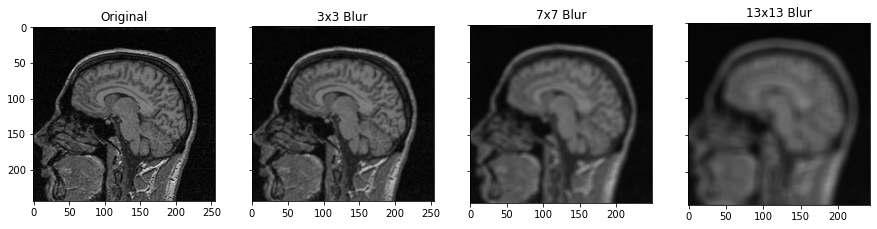

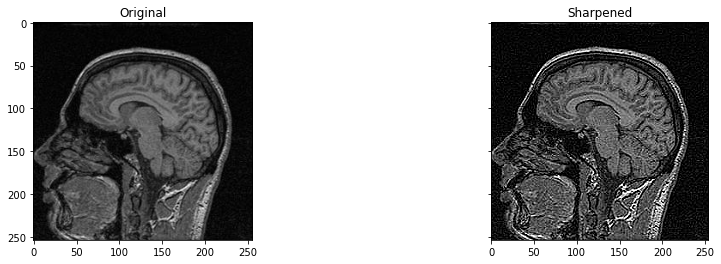

In [7]:
%run "helper_functions.py"
img = cv2.imread("images\\"+imgs[8],0)

blur3= (1/9) * np.ones([3,3])
blur_img_3=convolve2D(img, blur3)

blur7= (1/49) * np.ones([7,7])
blur_img_7=convolve2D(img, blur7)

blur13= (1/169) * np.ones([13,13])
blur_img_13=convolve2D(img, blur13)


sharpen= np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
sharpen_img=convolve2D(img, sharpen)


sub_images = []
sub_images.extend([img,blur_img_3,blur_img_7, blur_img_13])#, sharpen_img])
sub_titles = ["Original",  "3x3 Blur", "7x7 Blur", "13x13 Blur"]#, "Sharpened"]
displaySubplots(sub_images,sub_titles,4)

sub_images = []
sub_images.extend([img,sharpen_img])
sub_titles = ["Original",  "Sharpened"]
displaySubplots(sub_images,sub_titles,2)

####  From Built-In Functions

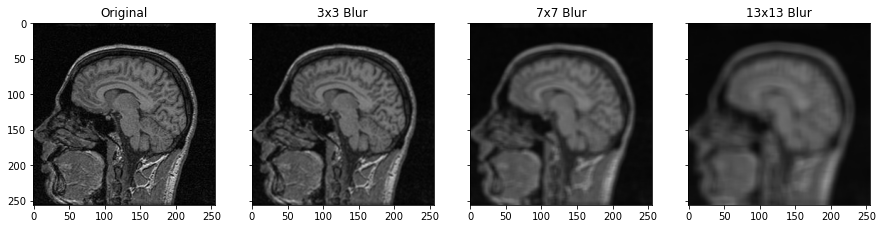

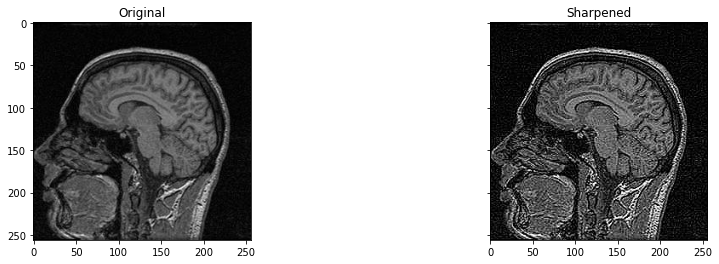

In [8]:

bi_blur3_img = cv2.filter2D(img,-1,blur3)


bi_blur7_img = cv2.filter2D(img,-1,blur7)

bi_blur13_img = cv2.filter2D(img,-1,blur13)


bi_sharpen_img = cv2.filter2D(img,-1,sharpen)

sub_images = []
sub_images.extend([img,bi_blur3_img, bi_blur7_img, bi_blur13_img])
sub_titles = ["Original", "3x3 Blur", "7x7 Blur", "13x13 Blur"]
displaySubplots(sub_images,sub_titles,4)

sub_images = []
sub_images.extend([img,bi_sharpen_img])
sub_titles = ["Original",  "Sharpened"]
displaySubplots(sub_images,sub_titles,2)

## Assignment 1 - 2.5

#### Box Filter

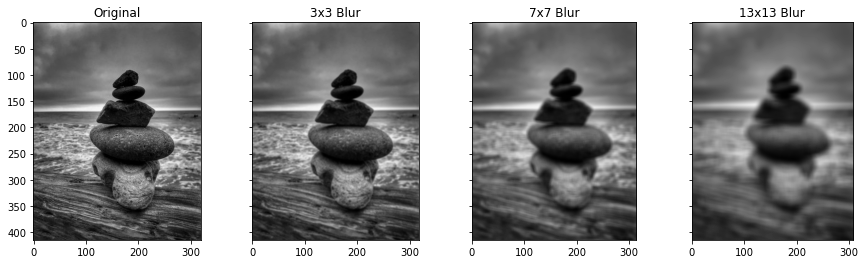

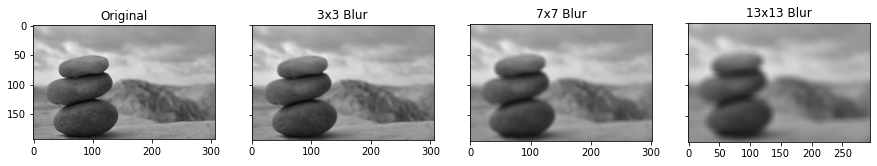

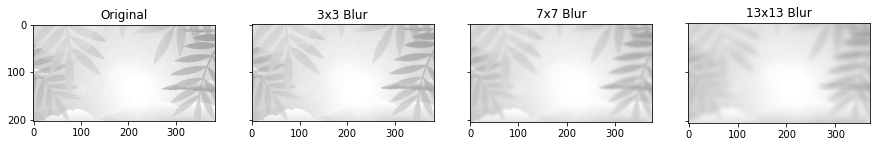

In [9]:
#importing helper functions from helper_function.py
%run "helper_functions.py"
%matplotlib inline

sub_titles = ["Original", "3x3 Blur", "7x7 Blur", "13x13 Blur"]
i=0
for img_nm in imgs:
    i=i+1
    img = cv2.imread("images\\" + img_nm,0)
    
    box_filter1 = np.ones([3,3])*(1/9)
    blur_img_3=convolve2D(img, box_filter1)
    
    
    box_filter2 = np.ones([7,7])*(1/49)
    blur_img_7=convolve2D(img, box_filter2)
    
    box_filter3 = np.ones([13,13])*(1/169)
    blur_img_13=convolve2D(img, box_filter3)
    
    sub_images = []
    sub_images.extend([img,blur_img_3, blur_img_7, blur_img_13])
    displaySubplots(sub_images,sub_titles,len(sub_images))
    if i ==3:
        break

#### Gaussian Filter

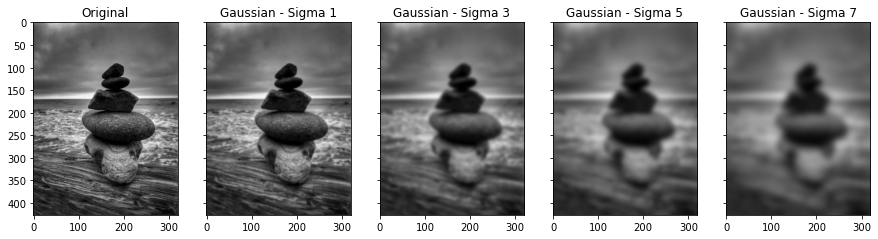

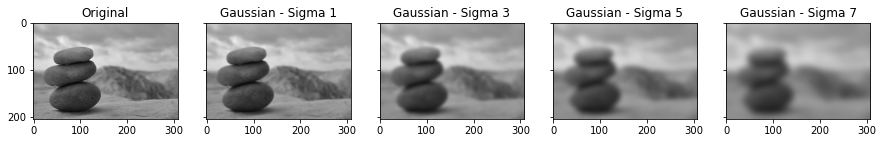

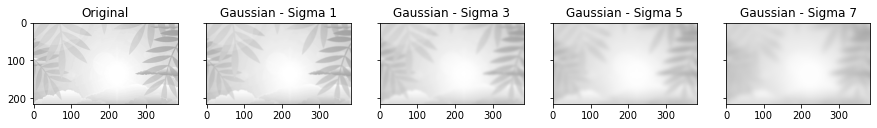

In [10]:
i=0
sub_titles = ["Original", "Gaussian - Sigma 1", "Gaussian - Sigma 3", "Gaussian - Sigma 5",
             "Gaussian - Sigma 7"]
for img_nm in imgs:
    i=i+1
    img = cv2.imread("images\\" + img_nm,0)
    img_gaussian_1=gaussian_filter(img,1)
    img_gaussian_3=gaussian_filter(img,3)
    img_gaussian_5=gaussian_filter(img,5)    
    img_gaussian_7=gaussian_filter(img,7)
    
    sub_images = []
    sub_images.extend([img,img_gaussian_1, img_gaussian_3, img_gaussian_5,img_gaussian_7])
    displaySubplots(sub_images,sub_titles,len(sub_images))    
    if i ==3:
        break

#### Gaussian Noise and Salt and Pepper Noise 
#### Applying Gaussian Filter and Median Filter to Both Noises

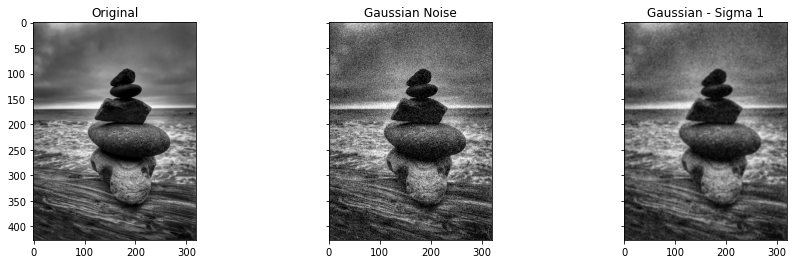

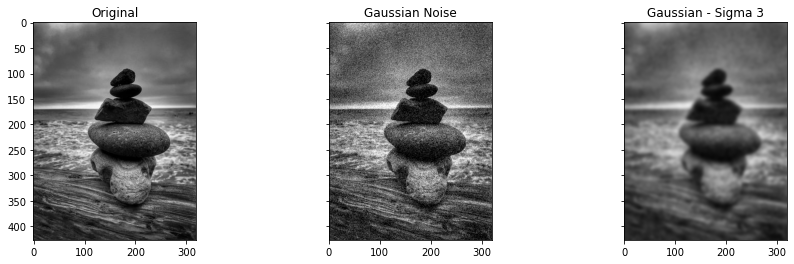

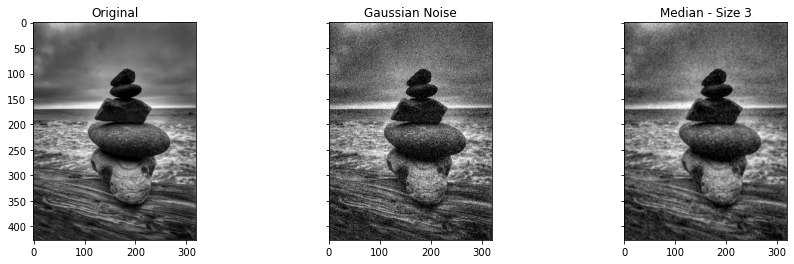

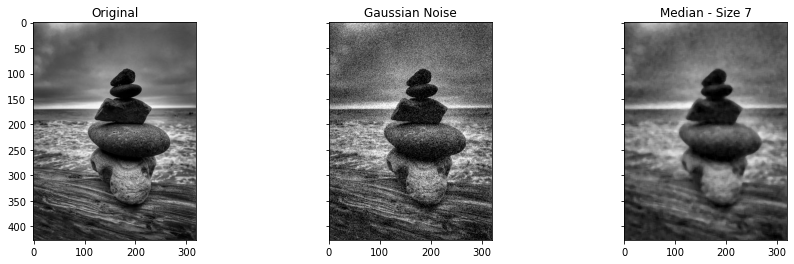

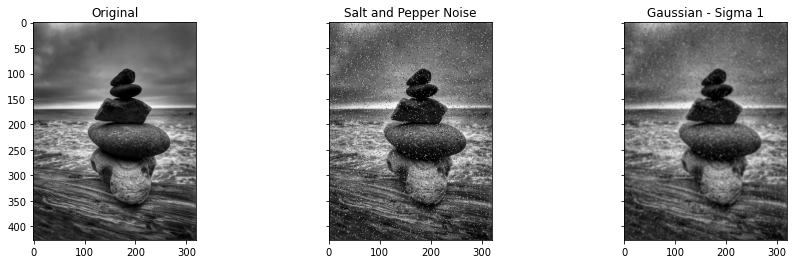

...

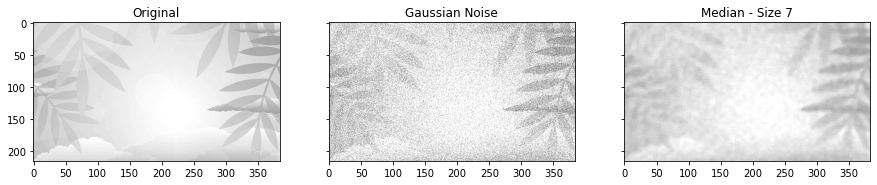

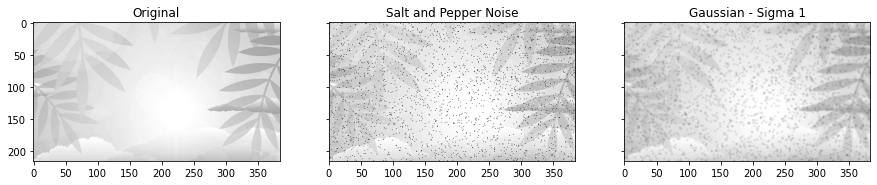

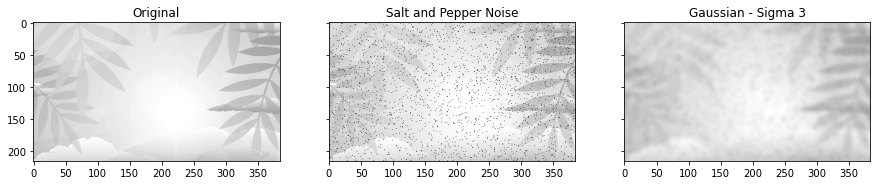

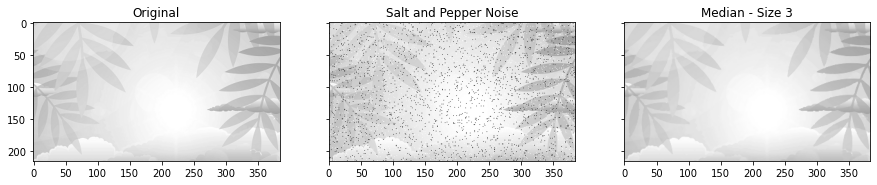

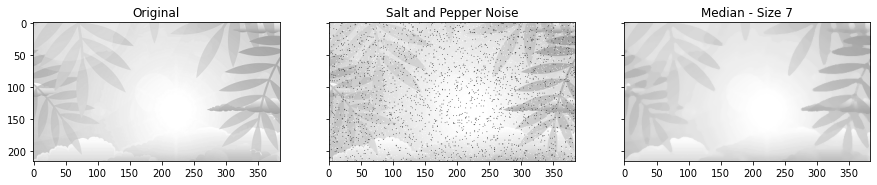

In [11]:
#importing helper functions from helper_function.py
%run "helper_functions.py"
%matplotlib inline




sub_titles = ["Original", "Gaussian Noise","Gaussian - Sigma 1"]
sub_titles2=["Original","Gaussian Noise","Gaussian - Sigma 3"]
sub_titles3 = ["Original","Gaussian Noise","Median - Size 3"]
sub_titles4 = ["Original","Gaussian Noise","Median - Size 7"]
sub_titles5=["Original","Salt and Pepper Noise","Gaussian - Sigma 1"]
sub_titles6=["Original","Salt and Pepper Noise","Gaussian - Sigma 3"]
sub_titles7 = ["Original","Salt and Pepper Noise","Median - Size 3"]
sub_titles8 = ["Original","Salt and Pepper Noise","Median - Size 7"]



i=0
for img_nm in imgs:
    i=i+1
    img = cv2.imread("images\\" + img_nm,0)

    # random_noise() method will convert image in [0, 255] to [0, 1.0],
    # inherently it use np.random.normal() to create normal distribution
    # and adds the generated noised back to image
    gaussian_noise_img = random_noise(img, mode='gaussian')
    gaussian_noise_img = (255*gaussian_noise_img).astype(np.uint8)
   
    gaussian_on_gaussian_noise1=gaussian_filter(gaussian_noise_img,1)
    gaussian_on_gaussian_noise2=gaussian_filter(gaussian_noise_img,3)
    median_on_gaussian_noise1= median_filter(gaussian_noise_img,3)
    median_on_gaussian_noise2= median_filter(gaussian_noise_img,7)

    sandp_noise_img = random_noise(img, mode='s&p')
    sandp_noise_img = (255*sandp_noise_img).astype(np.uint8)
    
    gaussian_on_salt_and_pepper_noise1=gaussian_filter(sandp_noise_img,1)
    gaussian_on_salt_and_pepper_noise2=gaussian_filter(sandp_noise_img,3)
    median_on_salt_and_pepper_noise1=median_filter(sandp_noise_img,3)
    median_on_salt_and_pepper_noise2= median_filter(sandp_noise_img,7)
    
    sub_images = []
    #Original, Gaussian Noise, Gaussian Filter - Sigma 3
    sub_images.extend([img,gaussian_noise_img
                       ,gaussian_on_gaussian_noise1])
    displaySubplots(sub_images,sub_titles,len(sub_images))
    
    
    #Gaussian Noise, Gaussian Filter - Sigma 3 and 7
    sub_images = []
    sub_images.extend([img,gaussian_noise_img
                       ,gaussian_on_gaussian_noise2])
    displaySubplots(sub_images,sub_titles2,len(sub_images))
    
    #Gaussian Noise, Median Filter - Sizes 3 and 7
    sub_images = []
    sub_images.extend([img,gaussian_noise_img,median_on_gaussian_noise1])
    displaySubplots(sub_images,sub_titles3,len(sub_images))
    
     #Salt and Pepper Noise, Gaussian Filter - Sigma 3 and 7
    sub_images = []
    sub_images.extend([img,gaussian_noise_img,median_on_gaussian_noise2])
    displaySubplots(sub_images,sub_titles4,len(sub_images))        
        
        
    sub_images = []
    sub_images.extend([img,sandp_noise_img,gaussian_on_salt_and_pepper_noise1])
    displaySubplots(sub_images,sub_titles5,len(sub_images))
    
    
    sub_images = []
    sub_images.extend([img,sandp_noise_img,gaussian_on_salt_and_pepper_noise2])
    displaySubplots(sub_images,sub_titles6,len(sub_images))
    
    #Salt and Pepper Noise, Median Filter - Sizes 3 and 7
    sub_images = []
    sub_images.extend([img,sandp_noise_img,median_on_salt_and_pepper_noise1])#,median_on_salt_and_pepper_noise2])
    displaySubplots(sub_images,sub_titles7,len(sub_images))
    
    sub_images = []
    sub_images.extend([img,sandp_noise_img,median_on_salt_and_pepper_noise2])#,median_on_salt_and_pepper_noise2])
    displaySubplots(sub_images,sub_titles8,len(sub_images))
    
    if i ==3:
        break

#### Mesh Plots for Gaussian Filter

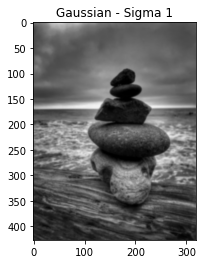

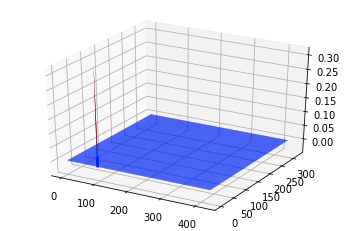

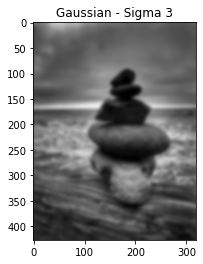

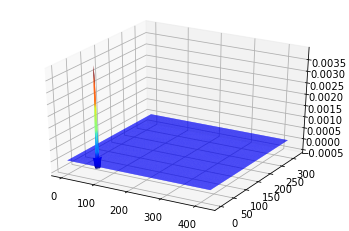

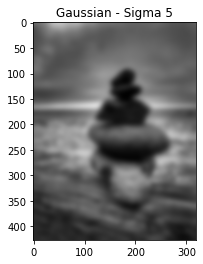

...

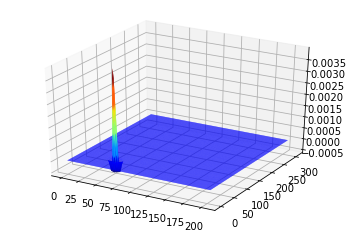

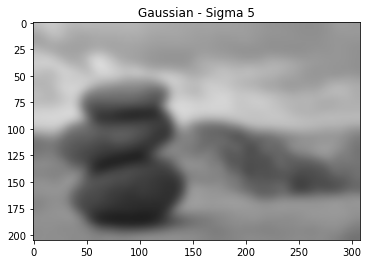

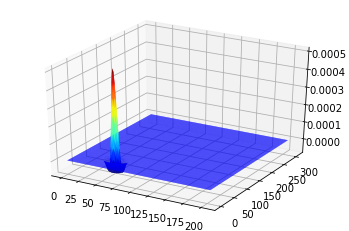

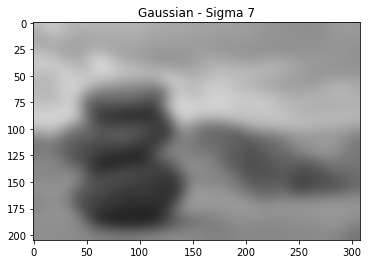

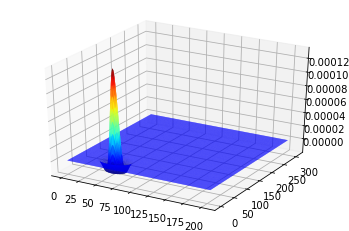

In [31]:
#importing helper functions from helper_function.py
%run "helper_functions.py"
%matplotlib inline

i=0

sub_titles = ["Original", "Gaussian - Sigma 1", "Gaussian - Sigma 3", "Gaussian - Sigma 5",
             "Gaussian - Sigma 7"]

for img_nm in imgs[0:2]:
    img = cv2.imread("images\\" + img_nm,0)
    
    img_gaussian_1=gaussian_filter(img,1)
    img_gaussian_3=gaussian_filter(img,3)
    img_gaussian_5=gaussian_filter(img,5)    
    img_gaussian_7=gaussian_filter(img,7)
    
    img_gaussians=[]
    img_gaussians.extend([img_gaussian_1,img_gaussian_3,img_gaussian_5,img_gaussian_7])
    N = 100
    half_N = N // 2
    num_list=[1,3,5,7]
    for num,img_gaussian in enumerate(img_gaussians):
        
        x, y = np.mgrid[0:img_gaussian.shape[0], 0:img_gaussian.shape[1]]
        z = -plot_helper(x - half_N, y - half_N, sigma=num_list[num])
        displayImage(img_gaussian,"Gaussian - Sigma " + str(num_list[num]))
        fig = plt.figure()
        ax = fig.gca(projection='3d')
        ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap="jet")
        plt.show()

#### Mesh Plot for First Order Derivative of Gaussian

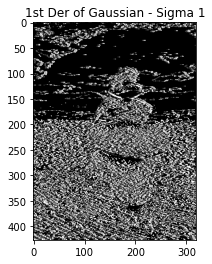

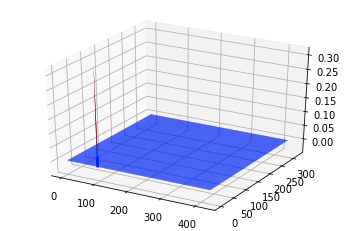

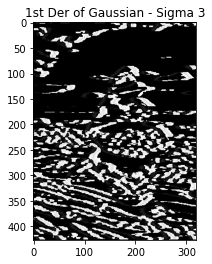

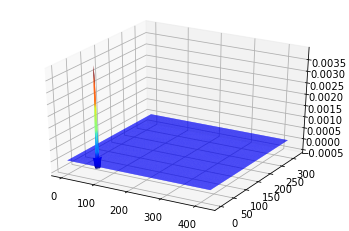

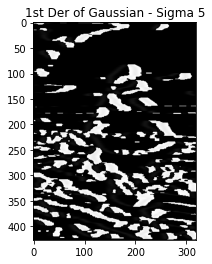

...

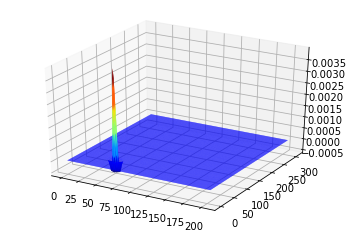

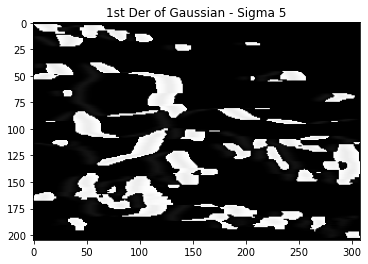

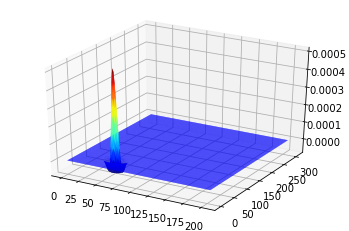

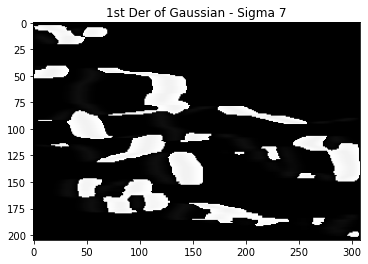

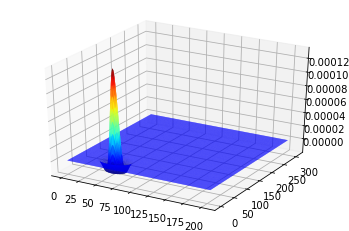

In [37]:
 #importing helper functions from helper_function.py
%run "helper_functions.py"
%matplotlib inline

i=0

sub_titles = ["Original", "1st Der of Gaussian - 1", "1st Der of Gaussian - Sigma 3", "1st Der of Gaussian - Sigma 5",
             "1st Der of Gaussian - Sigma 7"]

for img_nm in imgs[0:2]:
    img = cv2.imread("images\\" + img_nm,0)
    
    img_gaussian_1=gaussian_filter(img,1,(1,1))
    img_gaussian_3=gaussian_filter(img,3,(1,1))
    img_gaussian_5=gaussian_filter(img,5,(1,1))    
    img_gaussian_7=gaussian_filter(img,7,(1,1))
    
    img_gaussians=[]
    img_gaussians.extend([img_gaussian_1,img_gaussian_3,img_gaussian_5,img_gaussian_7])
    N = 100
    half_N = N // 2
    num_list=[1,3,5,7]
    for num,img_gaussian in enumerate(img_gaussians):
        
        x, y = np.mgrid[0:img_gaussian.shape[0], 0:img_gaussian.shape[1]]
        z = -plot_helper(x - half_N, y - half_N, sigma=num_list[num])
        displayImage(img_gaussian,"1st Der of Gaussian - Sigma " + str(num_list[num]))
        fig = plt.figure()
        ax = fig.gca(projection='3d')
        ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap="jet")
        plt.show()

#### Mesh Plot for Laplacian of Gaussian

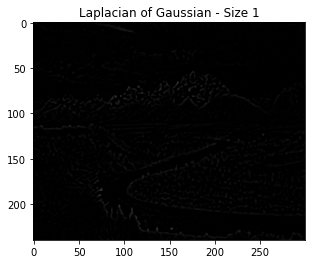

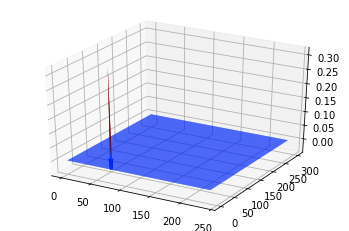

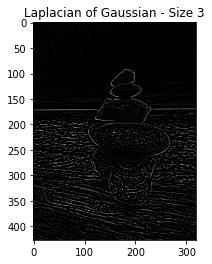

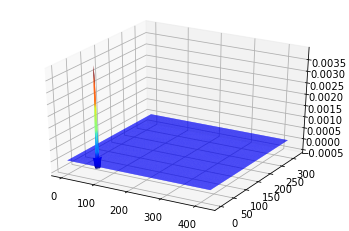

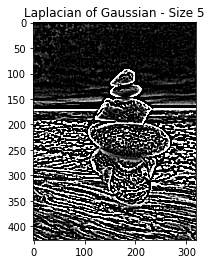

...

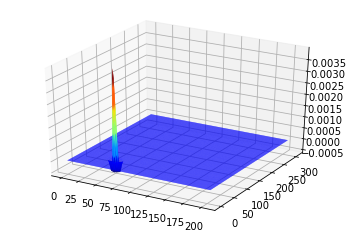

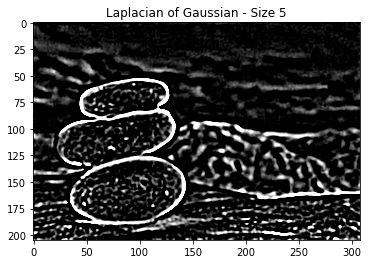

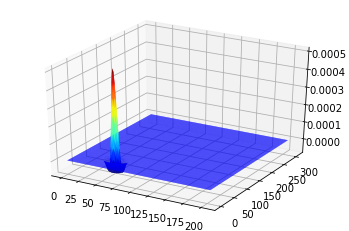

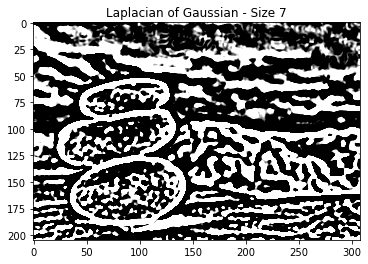

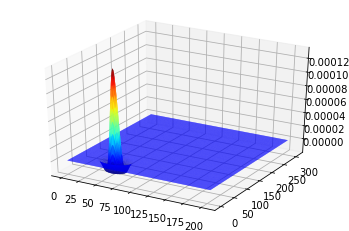

In [34]:
#importing helper functions from helper_function.py
%run "helper_functions.py"
%matplotlib inline

sub_titles = ["Original", "LoG - 1", "LoG - 3", "LoG - 5",
             "LoG - 7"]

for img_nm in imgs[0:2]:
    img = cv2.imread("images\\" + img_nm,0)
    
    
    blur1 = cv2.GaussianBlur(img,(1,1),0)
    log1 = cv2.Laplacian(blur,cv2.CV_64F, ksize=1)
    
    blur3 = cv2.GaussianBlur(img,(3,3),0)
    log3 = cv2.Laplacian(blur3,cv2.CV_64F, ksize=3)
    
    blur5 = cv2.GaussianBlur(img,(5,5),0)
    log5 = cv2.Laplacian(blur5,cv2.CV_64F, ksize=5)
    
    blur7 = cv2.GaussianBlur(img,(7,7),0)
    log7 = cv2.Laplacian(blur7,cv2.CV_64F, ksize=7)
    
    
    img_logs=[]
    img_logs.extend([log1,log3,log5,log7])
    N = 100
    half_N = N // 2
    num_list=[1,3,5,7]
    for num,img_log in enumerate(img_logs):
        
        x, y = np.mgrid[0:img_log.shape[0], 0:img_log.shape[1]]
        z = -plot_helper(x - half_N, y - half_N, sigma=num_list[num])
        displayImage(img_log,"Laplacian of Gaussian - Size " + str(num_list[num]))
        fig = plt.figure()
        ax = fig.gca(projection='3d')
        ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap="jet")
        plt.show()

## Assignment 1 - 2.6

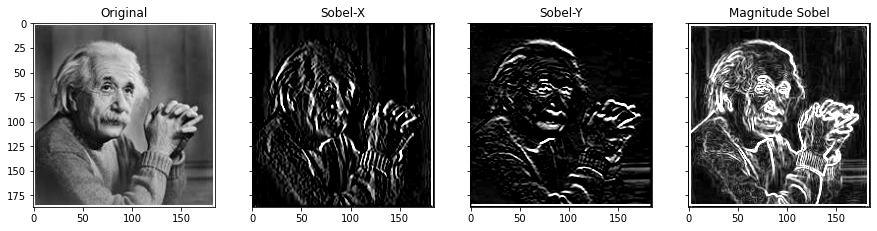

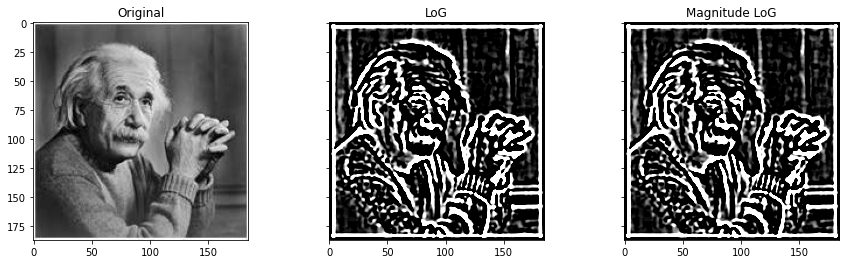

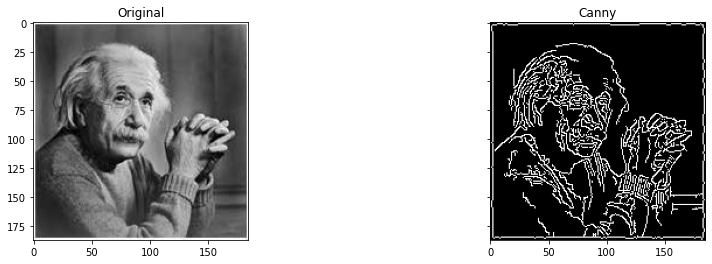

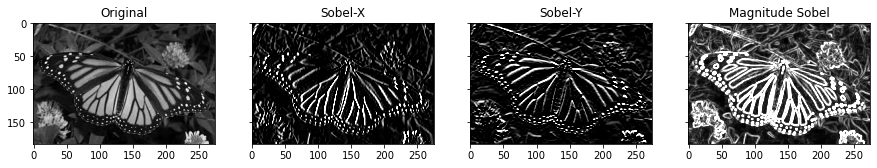

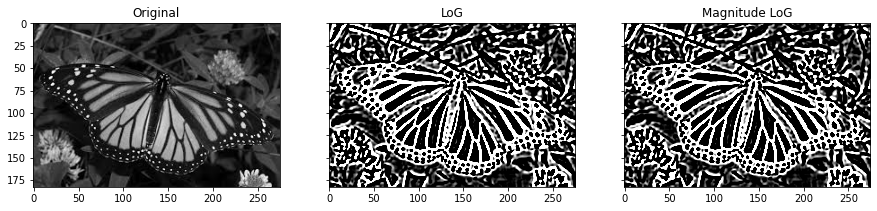

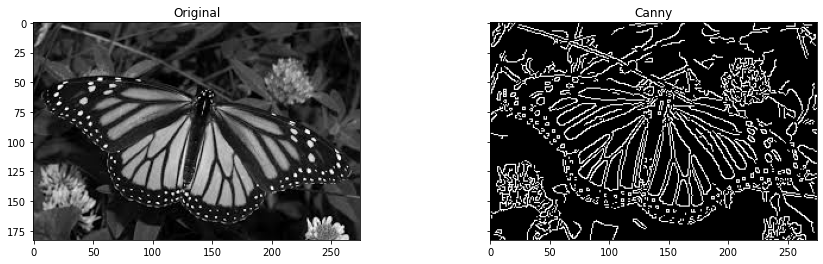

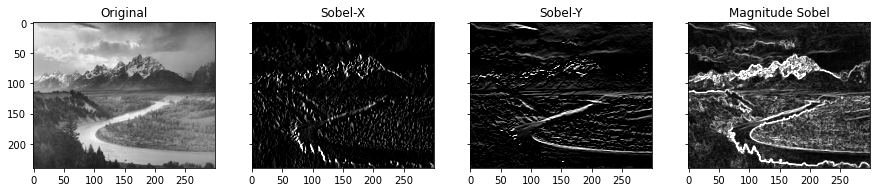

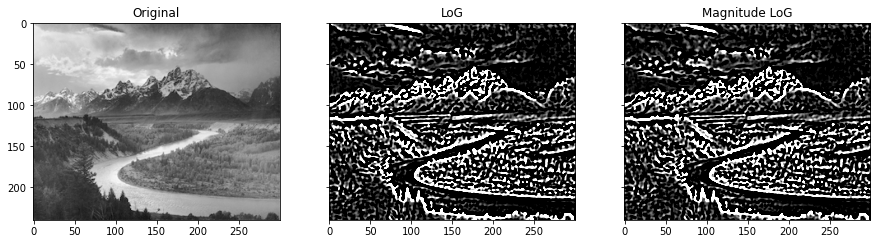

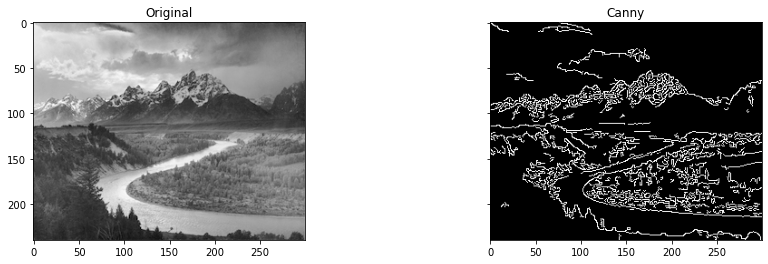

In [33]:
#importing helper functions from helper_function.py
%run "helper_functions.py"
%matplotlib inline


i=0
sub_titles=["Original","Sobel-X","Sobel-Y","Magnitude Sobel"]
sub_titles2=["Original","LoG","Magnitude LoG"]
sub_titles3=["Original", "Canny"]
for img_nm in imgs[3:]:
    i=i+1
    img = cv2.imread("images\\" + img_nm,0)
    x_sobel = cv2.Sobel(np.float32(img), cv2.CV_64F, 1, 0, ksize=3)
    y_sobel = cv2.Sobel(np.float32(img), cv2.CV_64F, 0, 1, ksize=3)
    gradient_sobel = cv2.magnitude(x_sobel,y_sobel)
    sub_images = []
    sub_images.extend([img,x_sobel, y_sobel,gradient_sobel])
    displaySubplots(sub_images,sub_titles,len(sub_images))
    #Laplacian of Gaussian - It's laplacian of Image
    blur = cv2.GaussianBlur(img,(5,5),0)
    log = cv2.Laplacian(blur,cv2.CV_64F, ksize=5)
    
    
    canny_img = cv2.Canny(img,100,200)
    #canny_img = cv2.Canny(img,np.min(img),np.max(img))
    
    sub_images = []
    sub_images.extend([img,log,log])
    displaySubplots(sub_images,sub_titles2,len(sub_images))
    
    sub_images = []
    sub_images.extend([img,canny_img])
    displaySubplots(sub_images,sub_titles3,len(sub_images))
    
    if i==3:
        break
        

## Assignment 1 - 2.7

In [13]:
%run "helper_functions.py"
%matplotlib inline
#Used for video capture
cap = cv2.VideoCapture(0) 
while(1): 
    #reading the video capture, and getting the return value (boolean) and the frame 
    ret, frame = cap.read() 
    canny_edges = cv2.Canny(frame,100,200)  
    cv2.imshow('Canny Edges',canny_edges) 
    cv2.waitKey(1)
    if cv2.getWindowProperty('Canny Edges', 4) < 1:
        break
#Release the window
cap.release() 
# Memory Deallocation
cv2.destroyAllWindows() 